In [1]:
!pip install imutils

  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25858 sha256=7d99bd12cc40623c063078e4abca44fd78b853a9b95e286c06a6d71b20a144fe
  Stored in directory: /root/.cache/pip/wheels/86/d7/0a/4923351ed1cec5d5e24c1eaf8905567b02a0343b24aa873df2
Successfully built imutils
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16
from keras.layers import AveragePooling2D
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Input
from keras.models import Model
from keras.optimizers import Adam
from keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imutils import paths
import shutil
import random
import cv2
import sys, os, glob, time, imageio 
import numpy as np, pandas as pd  
import matplotlib.pyplot as plt 
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image 
import torch 
import torchvision.utils as vutils 
import torchvision.transforms as transforms 
from keras import models, layers, optimizers 
from keras.models import Sequential 
from keras.preprocessing.image import array_to_img, img_to_array, load_img 
import tensorflow as tf 
import argparse
import os

In [3]:
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

plt.rcParams['figure.figsize'] = [8.0, 8.0]
plt.rcParams['figure.dpi'] = 100


Found GPU at: /device:GPU:0


In [4]:
path_root = '../input/chest-xray-pneumonia/chest_xray/chest_xray/'
path_train= '../input/chest-xray-pneumonia/chest_xray/chest_xray/train/'
path_test = '../input/chest-xray-pneumonia/chest_xray/chest_xray/test/'
path_val  = '../input/chest-xray-pneumonia/chest_xray/chest_xray/val/'

# Root paths for X-Ray images
XRay_normal     = glob.glob(path_root+'*/NORMAL/*.jpeg', recursive=True)
XRay_pneumonial = glob.glob(path_root+'*/PNEUMONIA/*.jpeg', recursive=True)

# Root paths for X-Ray training images
train_normal    = glob.glob(path_train+'NORMAL/*.jpeg', recursive=True)
train_pneumonial= glob.glob(path_train+'PNEUMONIA/*.jpeg', recursive=True)

# X-Ray testing images 
test_normal     = os.listdir(path_test+'NORMAL/')
test_pneumonial = os.listdir(path_test+'PNEUMONIA/')

print('The "Chest X-Ray Images" dataset contains {:04d} NORMAL and {:04d} PNEUMONIA images ({:03d} in total)'\
      .format(len(XRay_normal), 
              len(XRay_pneumonial),
              len(glob.glob(path_root+'*/*/*.jpeg')),))
print('   - {:04d} NORMAL and {:04d} PNEUMONIA ==> {:04d} images in the training sample'\
      .format(len(train_normal), 
              len(train_pneumonial), 
              len(glob.glob(path_train+'*/*.jpeg'))))
print('   - {:04d} NORMAL and {:04d} PNEUMONIA ==> {:04d} images in the testing sample'\
      .format(len(test_normal), 
              len(test_pneumonial), 
              len(glob.glob(path_test+'*/*.jpeg'))))
print('   - {:04d} NORMAL and {:04d} PNEUMONIA ==> {:04d} images in the validation sample'\
      .format(len(glob.glob(path_val+'NORMAL/*.jpeg')), 
              len(glob.glob(path_val+'PNEUMONIA/*.jpeg')), 
              len(glob.glob(path_val+'*/*.jpeg'))))

The "Chest X-Ray Images" dataset contains 1583 NORMAL and 4273 PNEUMONIA images (5856 in total)
   - 1341 NORMAL and 3875 PNEUMONIA ==> 5216 images in the training sample
   - 0234 NORMAL and 0390 PNEUMONIA ==> 0624 images in the testing sample
   - 0008 NORMAL and 0008 PNEUMONIA ==> 0016 images in the validation sample


In [5]:
# Time 
def _time(start, end): 
    # if in seconds 
    if (end-start)<60: 
        wall_time = f'{round((end-start),2)}sec'
    # if in minute(s)  
    elif (end-start)>=3600: 
        wall_time = f'{int((end-start)/3600)}h {int(((end-start)%3600)/60)}min {round((end-start)%60,2)}sec'
    # if in houre(s)  
    else: 
        wall_time = f'{int((end-start)/60)}min {round((end-start)%60,2)}sec'
    return wall_time

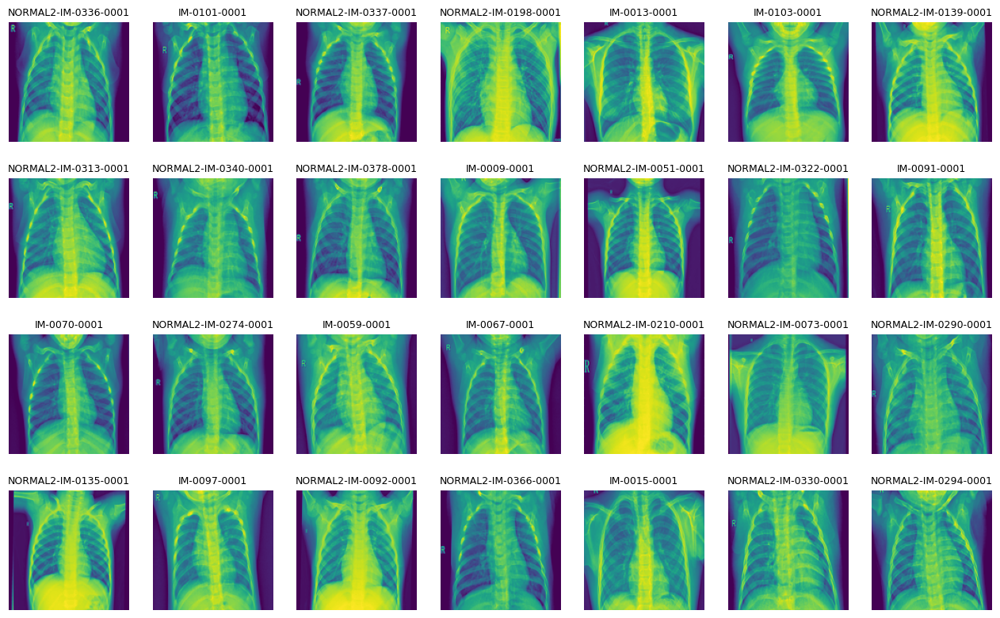

In [6]:
nrows, ncols = 4, 7
plt.figure(figsize=(16,10))
for idx, name in enumerate(test_normal[:nrows*ncols]):
    plt.subplot(nrows, ncols, idx+1)
    img = Image.open(path_test+'NORMAL/'+name) # or use plt.imread(path_test+'NORMAL/'+name)
    img = img.resize(size=(128, 128), resample=Image.ANTIALIAS, box=None)
    plt.imshow(img)
    plt.title(name[:-5], fontsize=9)
    plt.axis('off')

In [7]:
def get_data(data_path, dim=(128, 128), rand_shuffle=True): 
    start = time.time() 
    imgs_data = []         
    sample_size = len(data_path)
    for idx, im_path in enumerate(data_path): 
        if idx%(sample_size//10)==0:
            print('Processing index {:05d} of {:05d} ==> {:03d}%'\
                  .format(idx, sample_size, round(100*idx/sample_size))) 
        img = img_to_array(load_img(im_path, target_size = dim)) 
        imgs_data.append(img) 
        
    # to float 
    imgs_data = np.array(imgs_data).astype('float32') 
    
    imgs_data = imgs_data/255. 
    
    # shuffle the data 
    if rand_shuffle: 
        idx = np.arange(imgs_data.shape[0])
        np.random.shuffle(idx) 
        imgs_data = imgs_data[idx,:,:,:] 
    
    print(f"Hey! the calculations are done in {_time(start, time.time())}")
    return imgs_data  

In [8]:
print('Starting for NORMAL X-Ray images ...')
X_normal = get_data(XRay_normal)
print()
print('Starting for PNEUMONIA X-Ray images ...')
X_pneumonial = get_data(XRay_pneumonial) 

Starting for NORMAL X-Ray images ...
Processing index 00000 of 01583 ==> 000%
Processing index 00158 of 01583 ==> 010%
Processing index 00316 of 01583 ==> 020%
Processing index 00474 of 01583 ==> 030%
Processing index 00632 of 01583 ==> 040%
Processing index 00790 of 01583 ==> 050%
Processing index 00948 of 01583 ==> 060%
Processing index 01106 of 01583 ==> 070%
Processing index 01264 of 01583 ==> 080%
Processing index 01422 of 01583 ==> 090%
Processing index 01580 of 01583 ==> 100%
Hey! the calculations are done in 45.65sec

Starting for PNEUMONIA X-Ray images ...
Processing index 00000 of 04273 ==> 000%
Processing index 00427 of 04273 ==> 010%
Processing index 00854 of 04273 ==> 020%
Processing index 01281 of 04273 ==> 030%
Processing index 01708 of 04273 ==> 040%
Processing index 02135 of 04273 ==> 050%
Processing index 02562 of 04273 ==> 060%
Processing index 02989 of 04273 ==> 070%
Processing index 03416 of 04273 ==> 080%
Processing index 03843 of 04273 ==> 090%
Processing index 0

In [9]:
def define_grid(data_images, nrows=4, ncols=5, plot_grid=True):
    # save the started time 
    start = time.time() 
    ngpu = 1 
    
    device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
    
    data_transp = [np.transpose(data_images[i,:,:]) for i in range(data_images[:nrows*ncols].shape[0])]
    
    data_transp = torch.Tensor(data_transp)
    print(f'The shape is reordered from {data_images.shape[1:]} to {data_transp.shape[1:]} in {_time(start, time.time())}')
    
    # Make the grid 
    grid_images = np.transpose(
        vutils.make_grid(
            data_transp.to(device)[:nrows*ncols], 
            nrow=nrows,
            padding=2,
            normalize=True,
            scale_each=True,
            pad_value=1,
        ).cpu(), axes=(2,1,0))
        
   
    if plot_grid:
        plt.figure(figsize=(12,12)) 
        plt.axis("off") 
        plt.title(f'Grid of {nrows*ncols} real images', fontsize=27)
        plt.imshow(grid_images)
        
    return grid_images

grid_X_normal = define_grid(X_normal, plot_grid=False)
grid_X_pneumonial = define_grid(X_pneumonial, plot_grid=False)

The shape is reordered from (128, 128, 3) to torch.Size([3, 128, 128]) in 0.24sec
The shape is reordered from (128, 128, 3) to torch.Size([3, 128, 128]) in 0.23sec


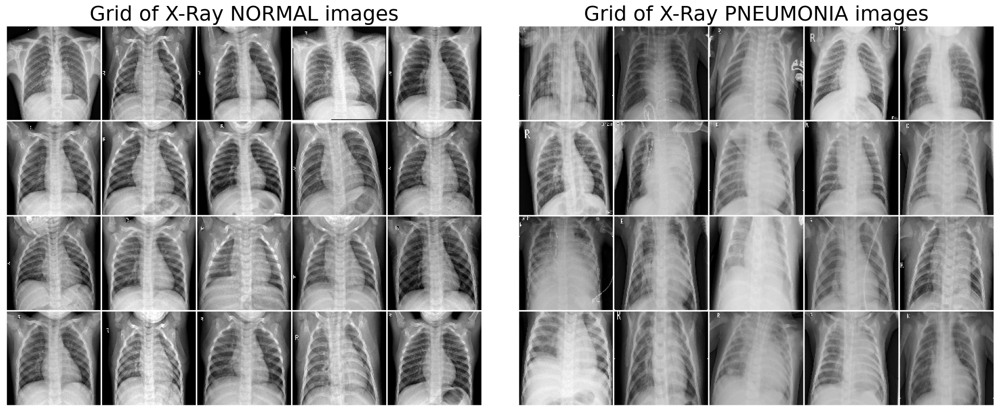

In [10]:
fig, (ax1, ax2)= plt.subplots(nrows=1, ncols=2, figsize=(19, 8))

ax1.imshow(grid_X_normal); ax1.axis('off')
ax1.set_title(label = 'Grid of X-Ray NORMAL images', fontsize = 27)

ax2.imshow(grid_X_pneumonial); ax2.axis('off')
ax2.set_title(label = 'Grid of X-Ray PNEUMONIA images', fontsize = 27)

plt.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=[0, 0.03, 1, 0.95])

In [11]:

n_epoch = 200 


batch_size = 128 


latent_dim = 100 


cols, rows = 128, 128 


channels = 3 
dim = cols, rows 
in_shape = (cols, rows, channels)


lr = 0.0002


beta1 = 0.5

ngpu = 1 

nrows, ncols = 3, 4

# Discriminator

In [12]:
def define_discriminator(in_shape=(128,128,3)): 
    model = models.Sequential() 
    # normal 
    model.add(layers.Conv2D(128, (5,5), padding='same', input_shape=in_shape)) 
    model.add(layers.LeakyReLU(alpha=0.2)) 
    # downsample to 64x64 
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same')) 
    model.add(layers.LeakyReLU(alpha=0.2)) 
    # downsample to 32x32 
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same')) 
    model.add(layers.LeakyReLU(alpha=0.2)) 
    # downsample to 16x16 
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same')) 
    model.add(layers.LeakyReLU(alpha=0.2)) 
    # downsample to 8x8 
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same')) 
    model.add(layers.LeakyReLU(alpha=0.2)) 
    # classifier 
    model.add(layers.Flatten()) 
    model.add(layers.Dropout(0.4)) 
    model.add(layers.Dense(1, activation='sigmoid')) 
    # compile model 
    opt = optimizers.Adam(lr=0.0002, beta_1=0.5) 
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy']) 
    return model

# Generator

In [13]:
def define_generator(latent_dim):
    model = models.Sequential()
    # foundation for 8x8 feature maps
    n_nodes = 128*8*8
    model.add(layers.Dense(n_nodes, input_dim=latent_dim))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Reshape((8, 8, 128)))
    # upsample to 16x16
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    # upsample to 64x64
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    # upsample to 128x128
    model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    # output layer 128x128x3
    model.add(layers.Conv2D(3, (5,5), activation='tanh', padding='same'))
    return model 

#input of G
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
    x_input = np.random.randn(latent_dim*n_samples)
    # reshape into a batch of inputs for the network
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input 

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    X = g_model.predict(x_input)
    # create 'fake' class labels (0)
    y = np.zeros((n_samples, 1))
    return X, y

In [14]:
def define_gan(g_model, d_model): 
    # make weights in the discriminator not trainable
    d_model.trainable = False 
    # connect them
    model = models.Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    opt = optimizers.Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# retrive real samples
def get_real_samples(dataset, n_samples):
    # choose random instances
    ix = np.random.randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # set 'real' class labels (1)
    y = np.ones((n_samples, 1))
    return X, y

# create and save a plot of generated images 
def show_generated(generated, epoch, nrows=4, ncols=5):
    #[-1,1] -> [0,1] 
    #generated = (generated+1)/2 
    #generated = (generated[:ncols*nrows]*127.5)+127.5 
    #generated = generated*255 
    plt.figure(figsize=(10,10)) 
    for idx in range(nrows*ncols): 
        plt.subplot(nrows, ncols, idx+1) 
        plt.imshow(generated[idx]) 
        plt.axis('off') 
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch+1)) 
    plt.show() 

# evaluate the discriminator and plot generated images 
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=100):
    # prepare real samples
    X_real, y_real = get_real_samples(dataset, n_samples)
    # evaluate discriminator on real examples 
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake examples 
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake examples 
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance 
    print('> Accuracy at epoch %d [real: %.0f%%, fake: %.0f%%]'%(epoch+1, acc_real*100, acc_fake*100))
    # show plot 
    show_generated(x_fake, epoch)  
    
def plot_loss(loss):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training", fontsize=20) 
    plt.plot(loss[0], label="D_real") 
    plt.plot(loss[1], label="D_fake") 
    plt.plot(loss[2], label="G") 
    plt.xlabel("Iteration", fontsize=20); plt.ylabel("Loss", fontsize=20) 
    plt.legend(); plt.show() 

In [15]:
def train(g_model, d_model, gan_model, dataset, latent_dim=100, n_epochs=100, n_batch=128):
    
    start = time.time() 
    bat_per_epo = int(dataset.shape[0]/n_batch) 
    half_batch = int(n_batch/2) 
    loss1, loss2, loss3 = [], [], [] 
    fake_liste = [] 
    
    # manually enumerate epochs
    print('Training Start...')
    for i in range(n_epochs):
        start1 = time.time()
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = get_real_samples(dataset, half_batch)
            # update discriminator model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update discriminator model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = np.ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
            loss1.append(d_loss1); loss2.append(d_loss2); loss3.append(g_loss) 
        
        print('Epoch: {:03d}/{:03d}, Loss: [D_real = {:2.3f}, D_fake = {:2.3f}, G = {:2.3f}], time: {:s}'\
              .format(i+1,n_epochs,d_loss1,d_loss2,g_loss, _time(start1,time.time())))
        # evaluate the model performance 
        if (i+1)%(n_epochs//10) == 0: 
            # Save and show generated images 
            summarize_performance(i, g_model, d_model, dataset, latent_dim) 
        
    print('Total time for training {} epochs is {} sec'.format(n_epochs, _time(start, time.time())))
    
    # Show loss curves 
    loss = (loss1, loss2, loss3) 
    plot_loss(loss) 

In [16]:
discriminator = define_discriminator() 
generator = define_generator(latent_dim) 

# create the gan 
gan = define_gan(generator, discriminator)

Training Start...
Epoch: 001/200, Loss: [D_real = 0.384, D_fake = 0.823, G = 0.764], time: 17.79sec
Epoch: 002/200, Loss: [D_real = 0.000, D_fake = 0.303, G = 2.980], time: 10.99sec
Epoch: 003/200, Loss: [D_real = 0.049, D_fake = 0.624, G = 0.882], time: 10.99sec
Epoch: 004/200, Loss: [D_real = 0.025, D_fake = 0.313, G = 1.622], time: 11.09sec
Epoch: 005/200, Loss: [D_real = 0.077, D_fake = 0.672, G = 0.806], time: 11.01sec
Epoch: 006/200, Loss: [D_real = 0.008, D_fake = 0.322, G = 1.485], time: 11.07sec
Epoch: 007/200, Loss: [D_real = 0.427, D_fake = 0.730, G = 0.958], time: 11.09sec
Epoch: 008/200, Loss: [D_real = 0.454, D_fake = 0.651, G = 1.275], time: 11.0sec
Epoch: 009/200, Loss: [D_real = 0.619, D_fake = 0.512, G = 1.935], time: 11.01sec
Epoch: 010/200, Loss: [D_real = 0.871, D_fake = 1.036, G = 1.014], time: 11.06sec
Epoch: 011/200, Loss: [D_real = 0.631, D_fake = 0.503, G = 1.162], time: 11.0sec
Epoch: 012/200, Loss: [D_real = 0.770, D_fake = 0.514, G = 1.070], time: 11.01sec


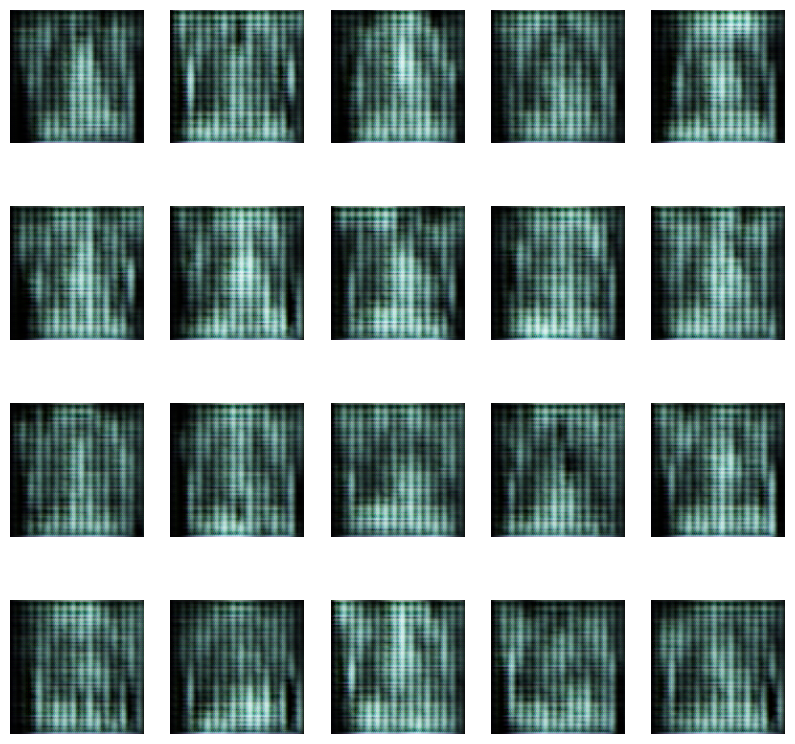

Epoch: 021/200, Loss: [D_real = 0.541, D_fake = 0.664, G = 1.192], time: 11.02sec
Epoch: 022/200, Loss: [D_real = 0.620, D_fake = 0.486, G = 1.924], time: 11.06sec
Epoch: 023/200, Loss: [D_real = 0.588, D_fake = 0.562, G = 1.227], time: 10.96sec
Epoch: 024/200, Loss: [D_real = 0.459, D_fake = 0.425, G = 1.661], time: 10.96sec
Epoch: 025/200, Loss: [D_real = 0.930, D_fake = 0.701, G = 1.294], time: 11.06sec
Epoch: 026/200, Loss: [D_real = 0.680, D_fake = 0.460, G = 1.618], time: 10.95sec
Epoch: 027/200, Loss: [D_real = 0.396, D_fake = 0.555, G = 1.513], time: 10.98sec
Epoch: 028/200, Loss: [D_real = 0.573, D_fake = 0.452, G = 1.839], time: 11.05sec
Epoch: 029/200, Loss: [D_real = 0.531, D_fake = 0.647, G = 1.839], time: 10.96sec
Epoch: 030/200, Loss: [D_real = 0.534, D_fake = 0.558, G = 1.737], time: 10.96sec
Epoch: 031/200, Loss: [D_real = 0.570, D_fake = 0.482, G = 1.807], time: 11.02sec
Epoch: 032/200, Loss: [D_real = 0.437, D_fake = 0.525, G = 2.160], time: 10.96sec
Epoch: 033/200, 

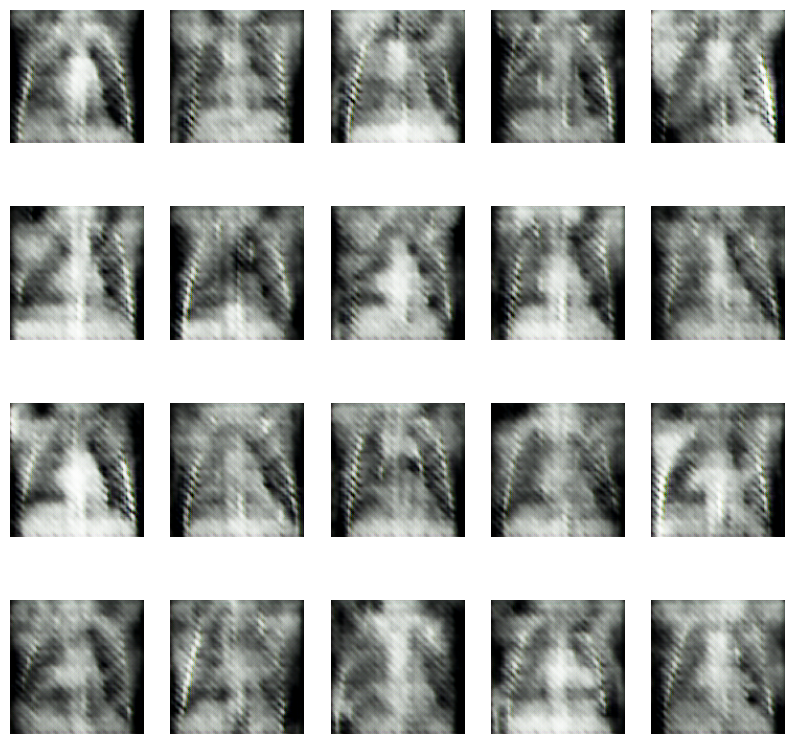

Epoch: 041/200, Loss: [D_real = 0.359, D_fake = 0.362, G = 2.726], time: 10.96sec
Epoch: 042/200, Loss: [D_real = 0.480, D_fake = 0.540, G = 3.233], time: 10.98sec
Epoch: 043/200, Loss: [D_real = 0.366, D_fake = 0.412, G = 2.462], time: 11.05sec
Epoch: 044/200, Loss: [D_real = 0.450, D_fake = 0.444, G = 2.757], time: 10.96sec
Epoch: 045/200, Loss: [D_real = 0.356, D_fake = 0.490, G = 3.263], time: 10.95sec
Epoch: 046/200, Loss: [D_real = 0.319, D_fake = 0.526, G = 1.888], time: 11.03sec
Epoch: 047/200, Loss: [D_real = 0.336, D_fake = 0.365, G = 2.755], time: 10.95sec
Epoch: 048/200, Loss: [D_real = 0.336, D_fake = 0.362, G = 2.488], time: 10.97sec
Epoch: 049/200, Loss: [D_real = 0.588, D_fake = 0.553, G = 2.414], time: 11.03sec
Epoch: 050/200, Loss: [D_real = 0.306, D_fake = 0.324, G = 2.294], time: 10.98sec
Epoch: 051/200, Loss: [D_real = 0.362, D_fake = 0.512, G = 2.700], time: 10.97sec
Epoch: 052/200, Loss: [D_real = 0.447, D_fake = 0.361, G = 2.452], time: 11.04sec
Epoch: 053/200, 

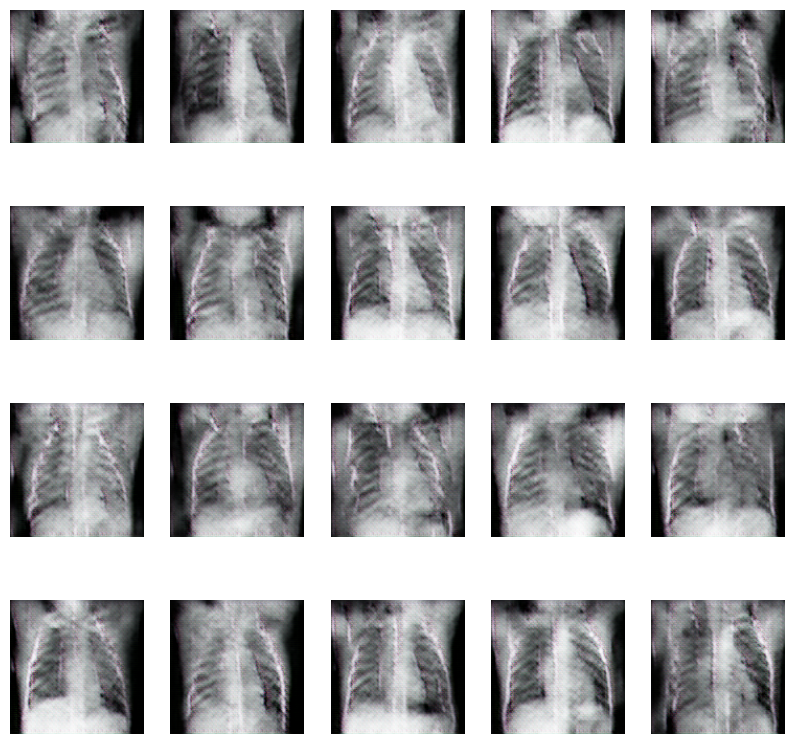

Epoch: 061/200, Loss: [D_real = 0.543, D_fake = 0.567, G = 3.349], time: 11.03sec
Epoch: 062/200, Loss: [D_real = 0.331, D_fake = 0.258, G = 2.922], time: 10.96sec
Epoch: 063/200, Loss: [D_real = 0.303, D_fake = 0.515, G = 3.342], time: 10.97sec
Epoch: 064/200, Loss: [D_real = 0.565, D_fake = 0.572, G = 2.777], time: 11.02sec
Epoch: 065/200, Loss: [D_real = 1.183, D_fake = 0.708, G = 1.983], time: 10.96sec
Epoch: 066/200, Loss: [D_real = 0.327, D_fake = 0.293, G = 2.948], time: 10.96sec
Epoch: 067/200, Loss: [D_real = 0.327, D_fake = 0.378, G = 2.491], time: 11.09sec
Epoch: 068/200, Loss: [D_real = 0.166, D_fake = 0.214, G = 3.494], time: 10.99sec
Epoch: 069/200, Loss: [D_real = 0.488, D_fake = 0.681, G = 1.225], time: 10.98sec
Epoch: 070/200, Loss: [D_real = 0.660, D_fake = 0.568, G = 1.164], time: 11.07sec
Epoch: 071/200, Loss: [D_real = 0.500, D_fake = 0.507, G = 1.528], time: 10.97sec
Epoch: 072/200, Loss: [D_real = 0.387, D_fake = 0.402, G = 2.257], time: 10.98sec
Epoch: 073/200, 

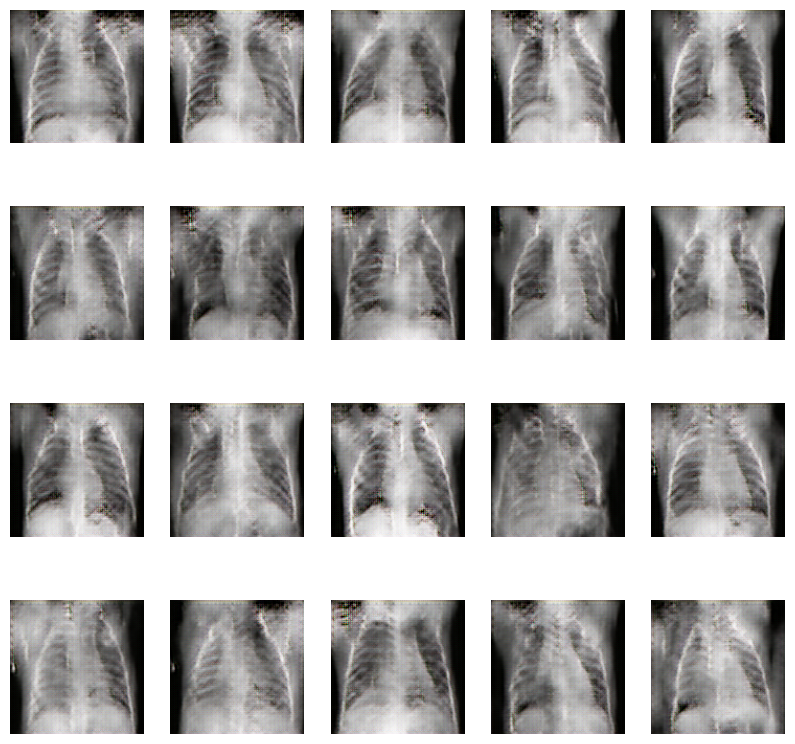

Epoch: 081/200, Loss: [D_real = 0.537, D_fake = 0.386, G = 2.524], time: 10.98sec
Epoch: 082/200, Loss: [D_real = 0.262, D_fake = 0.363, G = 3.353], time: 11.04sec
Epoch: 083/200, Loss: [D_real = 0.663, D_fake = 0.619, G = 6.623], time: 11.01sec
Epoch: 084/200, Loss: [D_real = 0.585, D_fake = 0.504, G = 2.337], time: 11.01sec
Epoch: 085/200, Loss: [D_real = 0.471, D_fake = 0.326, G = 2.411], time: 11.05sec
Epoch: 086/200, Loss: [D_real = 0.226, D_fake = 0.267, G = 2.900], time: 10.98sec
Epoch: 087/200, Loss: [D_real = 0.325, D_fake = 0.508, G = 3.167], time: 10.99sec
Epoch: 088/200, Loss: [D_real = 0.309, D_fake = 0.281, G = 2.897], time: 11.05sec
Epoch: 089/200, Loss: [D_real = 0.382, D_fake = 0.466, G = 3.063], time: 10.98sec
Epoch: 090/200, Loss: [D_real = 0.352, D_fake = 0.280, G = 2.927], time: 10.99sec
Epoch: 091/200, Loss: [D_real = 0.310, D_fake = 0.293, G = 3.100], time: 11.03sec
Epoch: 092/200, Loss: [D_real = 0.288, D_fake = 0.193, G = 3.123], time: 10.98sec
Epoch: 093/200, 

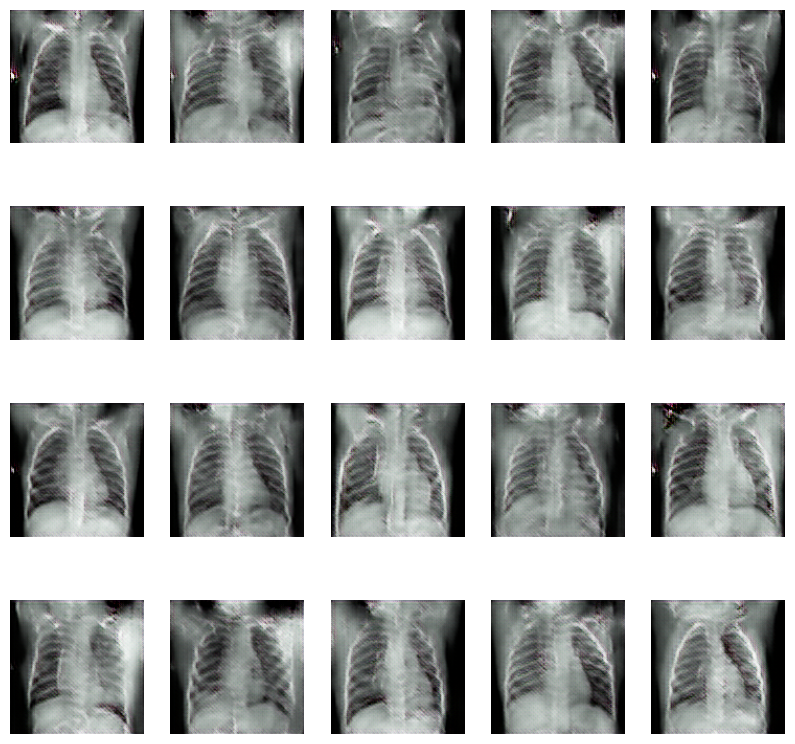

Epoch: 101/200, Loss: [D_real = 0.553, D_fake = 0.349, G = 2.712], time: 10.97sec
Epoch: 102/200, Loss: [D_real = 0.648, D_fake = 0.244, G = 2.517], time: 10.99sec
Epoch: 103/200, Loss: [D_real = 0.374, D_fake = 0.322, G = 3.325], time: 10.98sec
Epoch: 104/200, Loss: [D_real = 0.419, D_fake = 0.303, G = 3.023], time: 10.96sec
Epoch: 105/200, Loss: [D_real = 0.713, D_fake = 0.615, G = 2.804], time: 10.98sec
Epoch: 106/200, Loss: [D_real = 0.368, D_fake = 0.317, G = 2.644], time: 10.94sec
Epoch: 107/200, Loss: [D_real = 0.256, D_fake = 0.391, G = 2.631], time: 10.93sec
Epoch: 108/200, Loss: [D_real = 0.249, D_fake = 0.262, G = 3.510], time: 11.0sec
Epoch: 109/200, Loss: [D_real = 0.155, D_fake = 0.184, G = 3.236], time: 10.96sec
Epoch: 110/200, Loss: [D_real = 0.352, D_fake = 0.236, G = 3.032], time: 10.97sec
Epoch: 111/200, Loss: [D_real = 0.356, D_fake = 0.475, G = 3.438], time: 10.99sec
Epoch: 112/200, Loss: [D_real = 0.343, D_fake = 0.242, G = 3.115], time: 10.96sec
Epoch: 113/200, L

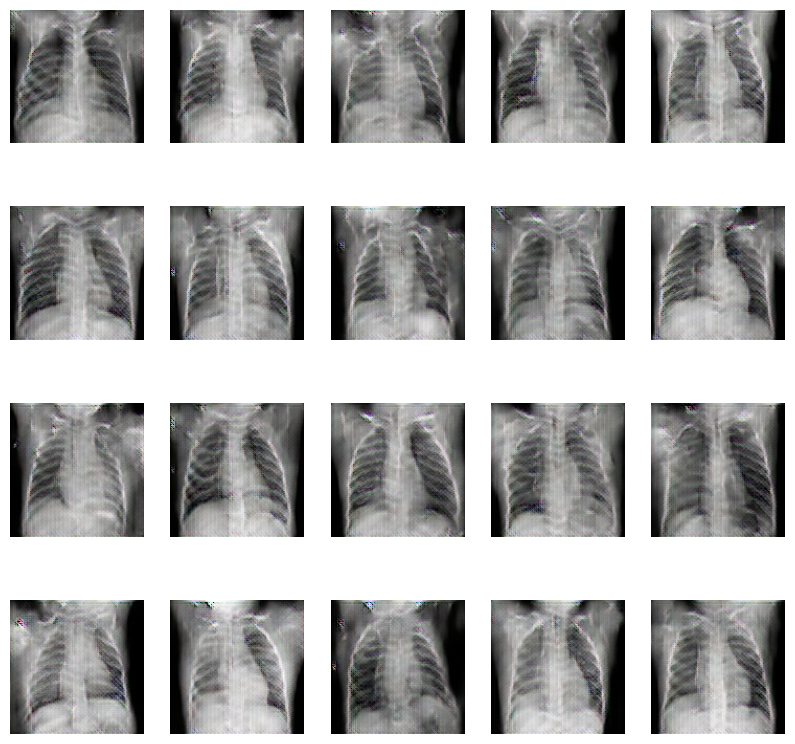

Epoch: 121/200, Loss: [D_real = 0.268, D_fake = 0.262, G = 3.606], time: 11.03sec
Epoch: 122/200, Loss: [D_real = 0.454, D_fake = 0.235, G = 2.792], time: 10.99sec
Epoch: 123/200, Loss: [D_real = 0.367, D_fake = 0.308, G = 3.676], time: 11.14sec
Epoch: 124/200, Loss: [D_real = 0.746, D_fake = 0.398, G = 2.689], time: 10.99sec
Epoch: 125/200, Loss: [D_real = 0.390, D_fake = 0.196, G = 3.007], time: 10.98sec
Epoch: 126/200, Loss: [D_real = 0.811, D_fake = 0.897, G = 3.569], time: 11.1sec
Epoch: 127/200, Loss: [D_real = 0.215, D_fake = 0.263, G = 3.128], time: 11.01sec
Epoch: 128/200, Loss: [D_real = 0.314, D_fake = 0.180, G = 3.165], time: 10.97sec
Epoch: 129/200, Loss: [D_real = 0.358, D_fake = 0.305, G = 3.376], time: 11.08sec
Epoch: 130/200, Loss: [D_real = 0.229, D_fake = 0.246, G = 2.948], time: 10.97sec
Epoch: 131/200, Loss: [D_real = 0.180, D_fake = 0.293, G = 3.618], time: 10.97sec
Epoch: 132/200, Loss: [D_real = 0.173, D_fake = 0.178, G = 3.245], time: 11.08sec
Epoch: 133/200, L

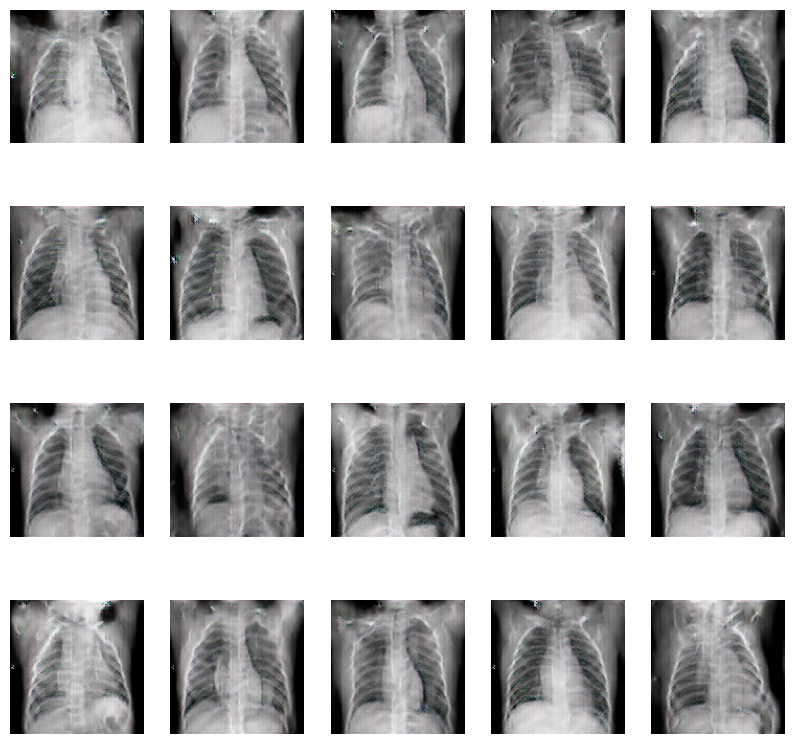

Epoch: 141/200, Loss: [D_real = 0.141, D_fake = 0.284, G = 3.790], time: 10.99sec
Epoch: 142/200, Loss: [D_real = 0.399, D_fake = 0.598, G = 3.557], time: 10.98sec
Epoch: 143/200, Loss: [D_real = 0.173, D_fake = 0.137, G = 3.975], time: 10.96sec
Epoch: 144/200, Loss: [D_real = 0.275, D_fake = 0.139, G = 3.318], time: 11.04sec
Epoch: 145/200, Loss: [D_real = 0.250, D_fake = 0.182, G = 3.227], time: 10.98sec
Epoch: 146/200, Loss: [D_real = 0.279, D_fake = 0.147, G = 3.571], time: 10.96sec
Epoch: 147/200, Loss: [D_real = 0.116, D_fake = 0.156, G = 4.288], time: 11.05sec
Epoch: 148/200, Loss: [D_real = 0.082, D_fake = 0.113, G = 3.814], time: 11.0sec
Epoch: 149/200, Loss: [D_real = 0.459, D_fake = 0.187, G = 3.516], time: 10.97sec
Epoch: 150/200, Loss: [D_real = 0.354, D_fake = 0.280, G = 3.271], time: 11.0sec
Epoch: 151/200, Loss: [D_real = 0.416, D_fake = 0.222, G = 3.722], time: 10.99sec
Epoch: 152/200, Loss: [D_real = 0.239, D_fake = 0.253, G = 4.314], time: 10.96sec
Epoch: 153/200, Lo

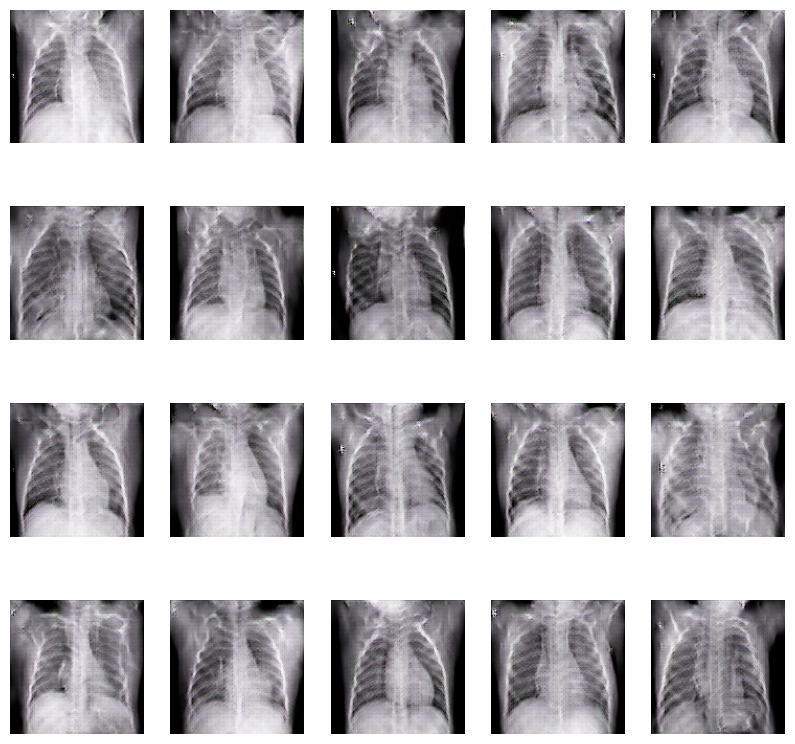

Epoch: 161/200, Loss: [D_real = 0.205, D_fake = 0.165, G = 4.049], time: 11.0sec
Epoch: 162/200, Loss: [D_real = 0.235, D_fake = 0.179, G = 3.576], time: 10.93sec
Epoch: 163/200, Loss: [D_real = 0.146, D_fake = 0.135, G = 4.227], time: 10.95sec
Epoch: 164/200, Loss: [D_real = 0.514, D_fake = 0.731, G = 3.683], time: 10.97sec
Epoch: 165/200, Loss: [D_real = 0.186, D_fake = 0.297, G = 4.710], time: 10.91sec
Epoch: 166/200, Loss: [D_real = 0.304, D_fake = 0.296, G = 3.381], time: 10.96sec
Epoch: 167/200, Loss: [D_real = 0.203, D_fake = 0.207, G = 3.775], time: 11.02sec
Epoch: 168/200, Loss: [D_real = 0.072, D_fake = 0.079, G = 4.951], time: 10.94sec
Epoch: 169/200, Loss: [D_real = 0.173, D_fake = 0.107, G = 4.196], time: 10.96sec
Epoch: 170/200, Loss: [D_real = 0.225, D_fake = 0.073, G = 3.698], time: 11.0sec
Epoch: 171/200, Loss: [D_real = 0.097, D_fake = 0.148, G = 4.222], time: 10.95sec
Epoch: 172/200, Loss: [D_real = 0.145, D_fake = 0.071, G = 3.903], time: 10.98sec
Epoch: 173/200, Lo

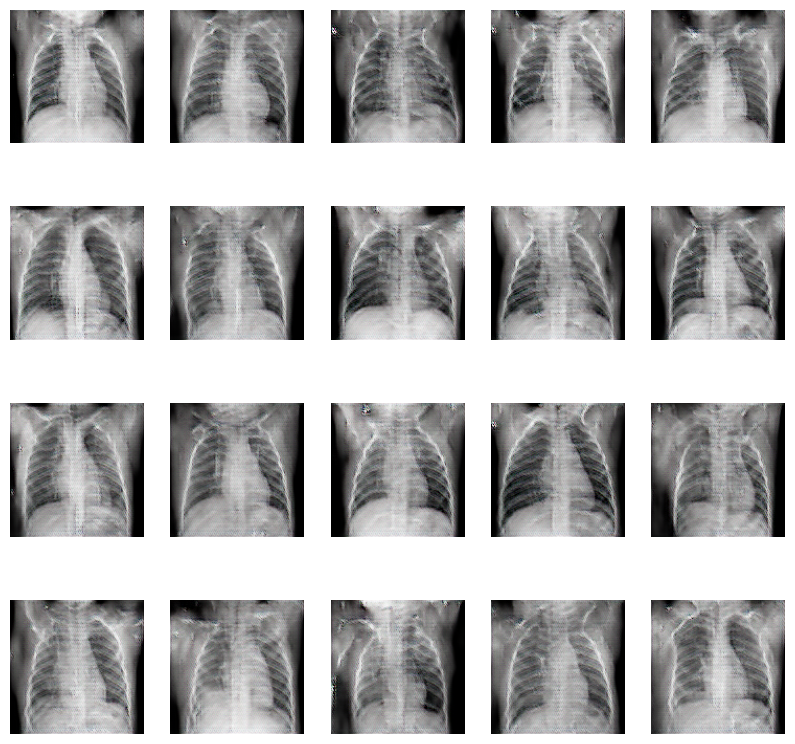

Epoch: 181/200, Loss: [D_real = 0.262, D_fake = 0.114, G = 4.664], time: 10.97sec
Epoch: 182/200, Loss: [D_real = 0.126, D_fake = 0.209, G = 4.697], time: 11.05sec
Epoch: 183/200, Loss: [D_real = 0.137, D_fake = 0.067, G = 3.983], time: 10.95sec
Epoch: 184/200, Loss: [D_real = 0.228, D_fake = 0.278, G = 4.550], time: 11.0sec
Epoch: 185/200, Loss: [D_real = 0.096, D_fake = 0.151, G = 3.723], time: 11.01sec
Epoch: 186/200, Loss: [D_real = 0.275, D_fake = 0.232, G = 3.410], time: 10.96sec
Epoch: 187/200, Loss: [D_real = 0.132, D_fake = 0.083, G = 3.815], time: 10.97sec
Epoch: 188/200, Loss: [D_real = 0.085, D_fake = 0.211, G = 4.887], time: 11.02sec
Epoch: 189/200, Loss: [D_real = 0.221, D_fake = 0.165, G = 3.257], time: 10.95sec
Epoch: 190/200, Loss: [D_real = 0.097, D_fake = 0.071, G = 3.883], time: 10.97sec
Epoch: 191/200, Loss: [D_real = 0.417, D_fake = 0.293, G = 3.536], time: 10.96sec
Epoch: 192/200, Loss: [D_real = 0.099, D_fake = 0.099, G = 4.119], time: 10.93sec
Epoch: 193/200, L

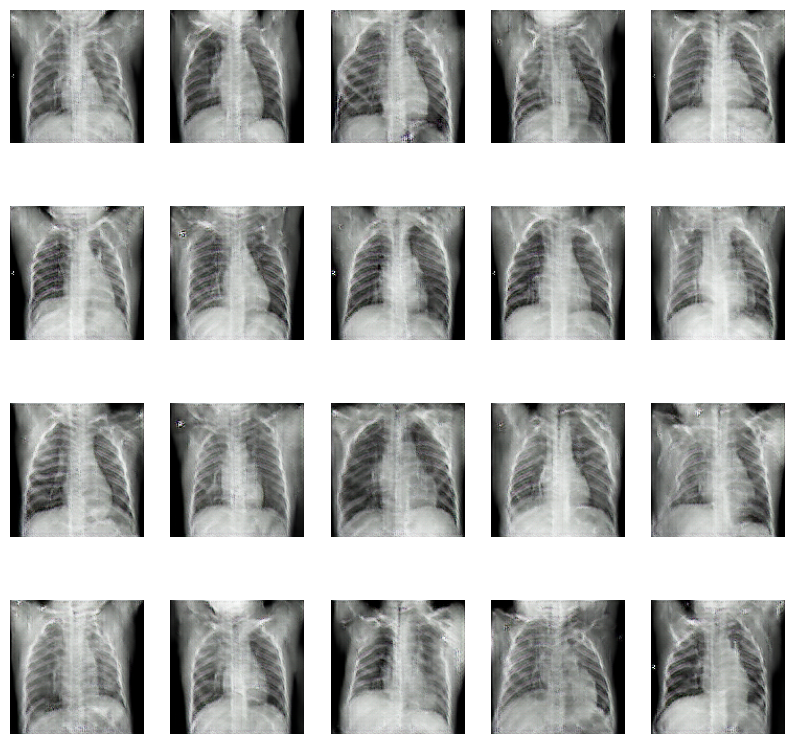

Total time for training 200 epochs is 37min 2.17sec sec


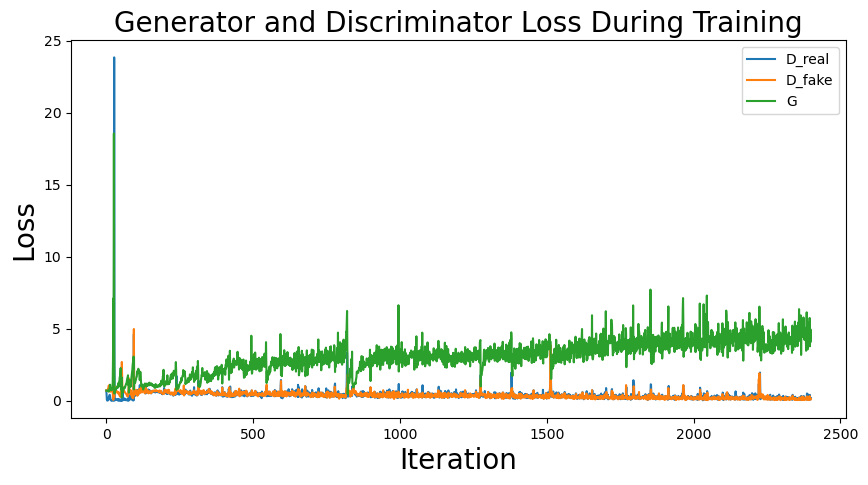

In [17]:
train(generator, discriminator, gan, X_normal, latent_dim, n_epochs=n_epoch, n_batch=batch_size)

In [18]:
def XRayFakeGenerator(g_model=generator, latent_dim =100, n_samples=100, show_gen=False):
    # generate points in latent space 
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs 
    X = g_model.predict(x_input)  
    
    # Show the generated images
    if show_gen and n_samples<=30: 
        ncols = 5
        nrows = int(n_samples/ncols)
        plt.figure(figsize=(12,10)) 
        for idx in range(nrows*ncols): 
            plt.subplot(nrows, ncols, idx+1)
            plt.imshow(X[idx,:,:]); plt.axis('off')
        plt.show();
    return X 

XRay_fake = XRayFakeGenerator(generator, n_samples=20)

In [19]:
import zipfile
output_path = zipfile.PyZipFile('../working/XRayNormalFake.zip', mode='w')

XRay_generated = XRayFakeGenerator(n_samples=1000)
for idx in range(XRay_generated.shape[0]):
    img_XRayFake  = XRay_generated[idx,:,:]
    name_XRayFake = 'XRay_generated {:04d}.png'.format(idx)
    imageio.imwrite(name_XRayFake, img_XRayFake)
    
    output_path.write(name_XRayFake)
    os.remove(name_XRayFake) 
output_path.close()

In [20]:
output_path

<zipfile.PyZipFile [closed]>

In [21]:
dataset_path = './dataset'

In [22]:
%%bash
rm -rf dataset
mkdir -p dataset/covid
mkdir -p dataset/normal
mkdir -p dataset/pneumonia
mkdir -p dataset/new

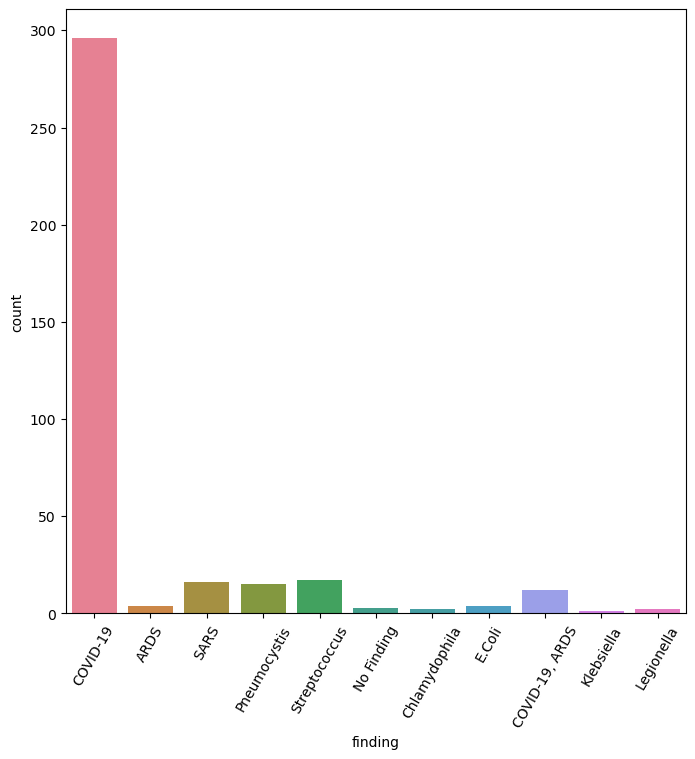

In [23]:
eda = pd.read_csv('../input/covid-chest-xray/metadata.csv')


sns.countplot(x = 'finding', data = eda, palette = 'husl')
plt.xticks(rotation=60)
plt.show()

In [24]:
covid_19_path = "../input/covid19-radiography-database/COVID-19_Radiography_Dataset/COVID/images"
pneumonia_dataset_path ='../input/ganpneumonia/XRayPneumonialFake'
normal_path="../input/gan-normal/XRayNormalFake"

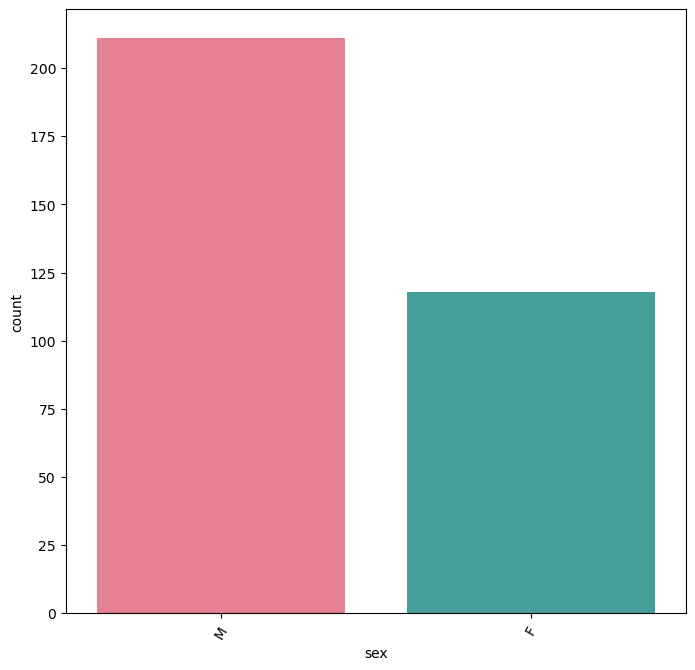

In [25]:
sns.countplot(x = 'sex', data = eda, palette = 'husl')
plt.xticks(rotation=60)
plt.show()

In [26]:
# csvPath = os.path.sep.join([covid_19_path, "metadata.csv"])
# df = pd.read_csv(csvPath)

# for (i, row) in df.iterrows():
#     if row["finding"] != "COVID-19" or row["view"] != "PA":
#         continue

#     imagePath = os.path.sep.join([covid_19_path, "images", row["filename"]])
#     if not os.path.exists(imagePath):
#         continue
#     filename = row["filename"].split(os.path.sep)[-1]
#     outputPath = os.path.sep.join([f"{dataset_path}/covid", filename])

#     # copy the image
#     shutil.copy2(imagePath, outputPath)

In [27]:
basePath = os.path.sep.join([covid_19_path])
imagePaths = list(paths.list_images(basePath))
samples = 600

random.seed(42)
random.shuffle(imagePaths)
imagePaths = imagePaths[:samples]

# loop over the image paths
for (i, imagePath) in enumerate(imagePaths):
    filename = imagePath.split(os.path.sep)[-1]
    outputPath = os.path.sep.join([f"{dataset_path}/covid", filename])
    shutil.copy2(imagePath, outputPath)

In [28]:
len(list(paths.list_images("./dataset/covid")))

600

In [29]:
basePath = os.path.sep.join([normal_path])
imagePaths = list(paths.list_images(basePath))
samples = 600

random.seed(42)
random.shuffle(imagePaths)
imagePaths = imagePaths[:samples]

# loop over the image paths
for (i, imagePath) in enumerate(imagePaths):
    filename = imagePath.split(os.path.sep)[-1]
    outputPath = os.path.sep.join([f"{dataset_path}/normal", filename])
    shutil.copy2(imagePath, outputPath)

In [30]:
len(list(paths.list_images("./dataset/normal")))

600

In [31]:
basePath = os.path.sep.join([pneumonia_dataset_path])
imagePaths = list(paths.list_images(basePath))
samples = 600

random.seed(42)
random.shuffle(imagePaths)
imagePaths = imagePaths[:samples]

# loop over the image paths
for (i, imagePath) in enumerate(imagePaths):
    
    filename = imagePath.split(os.path.sep)[-1]
    outputPath = os.path.sep.join([f"{dataset_path}/pneumonia", filename])

    # copy the image
    shutil.copy2(imagePath, outputPath)

In [32]:
len(list(paths.list_images("./dataset/pneumonia")))

600

In [33]:
def ceildiv(a, b):
    return -(-a // b)

def plots_from_files(imspaths, figsize=(30,20), rows=1, titles=None, maintitle=None):
    """Plot the images in a grid"""
    f = plt.figure(figsize=figsize)
    if maintitle is not None: plt.suptitle(maintitle, fontsize=10)
    for i in range(len(imspaths)):
        sp = f.add_subplot(rows, ceildiv(len(imspaths), rows), i+1)
        sp.axis('Off')
        if titles is not None: sp.set_title(titles[i], fontsize=16)
        img = plt.imread(imspaths[i])
        plt.imshow(img)

normal_images = list(paths.list_images(f"{dataset_path}/normal"))
covid_images = list(paths.list_images(f"{dataset_path}/covid"))
pneumonia_images = list(paths.list_images(f"{dataset_path}/pneumonia"))


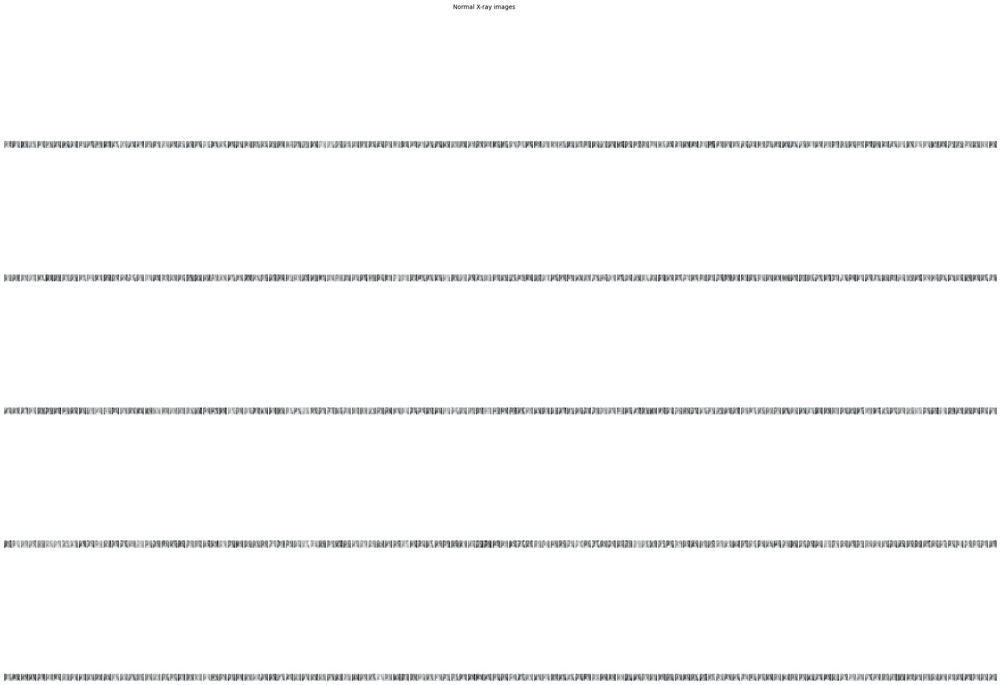

In [34]:
plots_from_files(normal_images, rows=5, maintitle="Normal X-ray images")

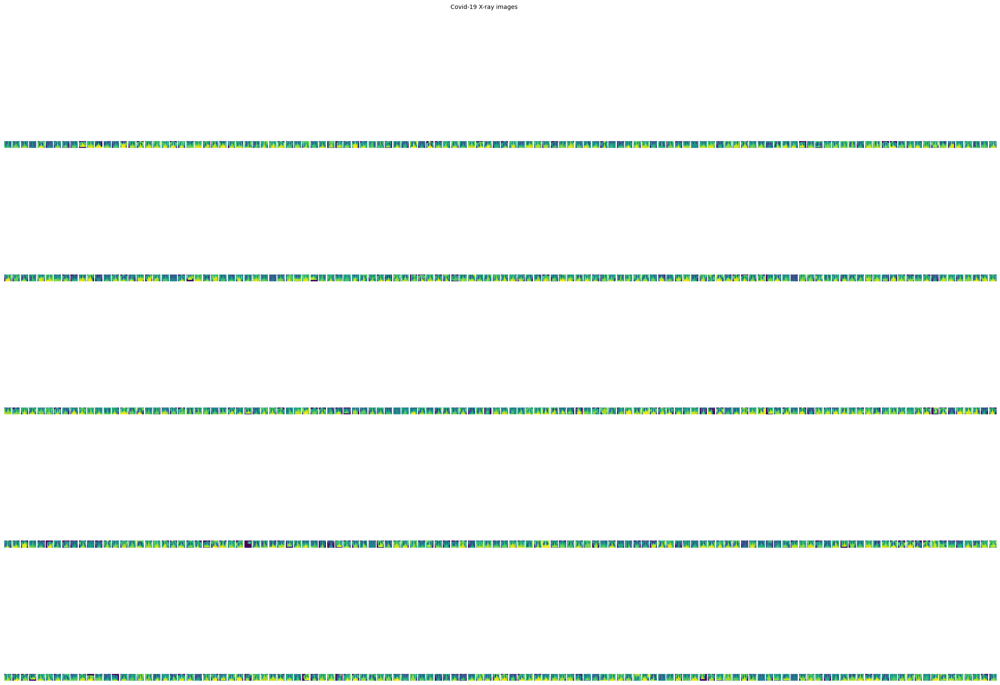

In [35]:
plots_from_files(covid_images, rows=5, maintitle="Covid-19 X-ray images")

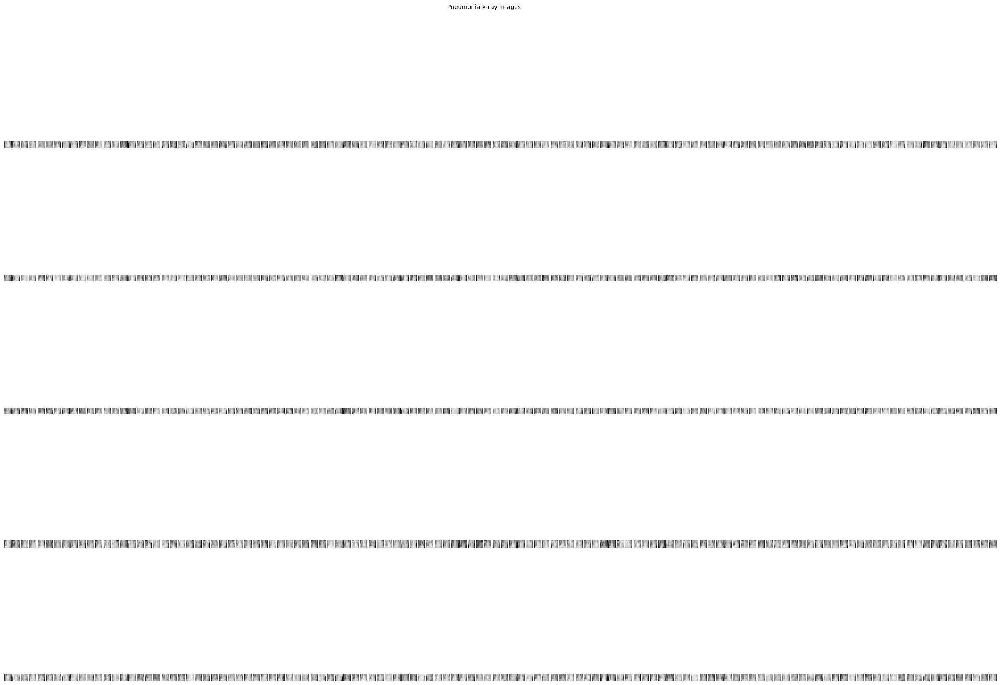

In [36]:
plots_from_files(pneumonia_images, rows=5, maintitle="Pneumonia X-ray images")

In [37]:

INIT_LR = 1e-3
EPOCHS = 20
BS = 8

In [38]:
print("[INFO] loading images...")
imagePaths = list(paths.list_images(dataset_path))
data = []
labels = []
# loop over the image paths
for imagePath in imagePaths:
    label = imagePath.split(os.path.sep)[-2]
    image = cv2.imread(imagePath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    # update the data and labels lists, respectively
    data.append(image)
    labels.append(label)
data = np.array(data) / 255.0
labels = np.array(labels)
print("[INFO] Images successfully loaded")

[INFO] loading images...
[INFO] Images successfully loaded


In [39]:
lb_encoder = LabelEncoder()
labels = lb_encoder.fit_transform(labels)
labels = to_categorical(labels)


# Split the data into training and testing using the 80% of training and 20% to testing
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size = 0.2, stratify = labels,random_state = 42)


# Set the image augmentation of the training data
trainAug = ImageDataGenerator(rotation_range= 15, fill_mode='nearest')


In [40]:
base_model = VGG16(weights = 'imagenet', include_top=False, input_tensor=Input(shape=(224,224,3)))
headmodel = base_model.output
headmodel = AveragePooling2D(pool_size =(4, 4))(headmodel)
headmodel = Flatten(name ='Flatten')(headmodel)
headmodel = Dense(64, activation = 'relu')(headmodel)
headmodel = Dropout(0.5)(headmodel)
headmodel = Dense(3, activation = 'softmax')(headmodel)

model = Model(inputs = base_model.input, outputs = headmodel)

for layers in base_model.layers:
    layers.trainable = False


opt = Adam(lr = INIT_LR, decay = INIT_LR/EPOCHS)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ['accuracy'])


58892288/58889256 [==============================] - 0s 0us/step


In [41]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

In [42]:
# training the model with gpu or cpu, it depends:

with tf.device('/gpu:0'):
    print("Training the model with gpu . . .")
    training = model.fit_generator(trainAug.flow(X_train, y_train, batch_size = BS),steps_per_epoch=len(X_train) // BS, validation_data=(X_test, y_test), validation_steps=len(X_test) // BS, epochs=20)

#with tf.device('/cpu:0'):
#    print("Training the model with cpu . . .")
#    training = model.fit_generator(trainAug.flow(X_train, y_train, batch_size = BS),steps_per_epoch=len(X_train) // BS, validation_data=(X_test, y_test), validation_steps=len(X_test) // BS, epochs=100)

    

Training the model with gpu . . .
Epoch 1/20
180/180 [==============================] - 18s 100ms/step - loss: 0.3894 - accuracy: 0.7514 - val_loss: 0.1739 - val_accuracy: 0.9639
Epoch 2/20
180/180 [==============================] - 17s 94ms/step - loss: 0.1618 - accuracy: 0.9389 - val_loss: 0.0828 - val_accuracy: 0.9778
Epoch 3/20
180/180 [==============================] - 17s 96ms/step - loss: 0.1055 - accuracy: 0.9632 - val_loss: 0.0500 - val_accuracy: 0.9778
Epoch 4/20
180/180 [==============================] - 17s 96ms/step - loss: 0.0755 - accuracy: 0.9778 - val_loss: 0.0320 - val_accuracy: 0.9861
Epoch 5/20
180/180 [==============================] - 17s 95ms/step - loss: 0.0497 - accuracy: 0.9861 - val_loss: 0.0256 - val_accuracy: 0.9889
Epoch 6/20
180/180 [==============================] - 17s 97ms/step - loss: 0.0398 - accuracy: 0.9896 - val_loss: 0.0194 - val_accuracy: 0.9917
Epoch 7/20
180/180 [==============================] - 17s 94ms/step - loss: 0.0349 - accuracy: 0.9903

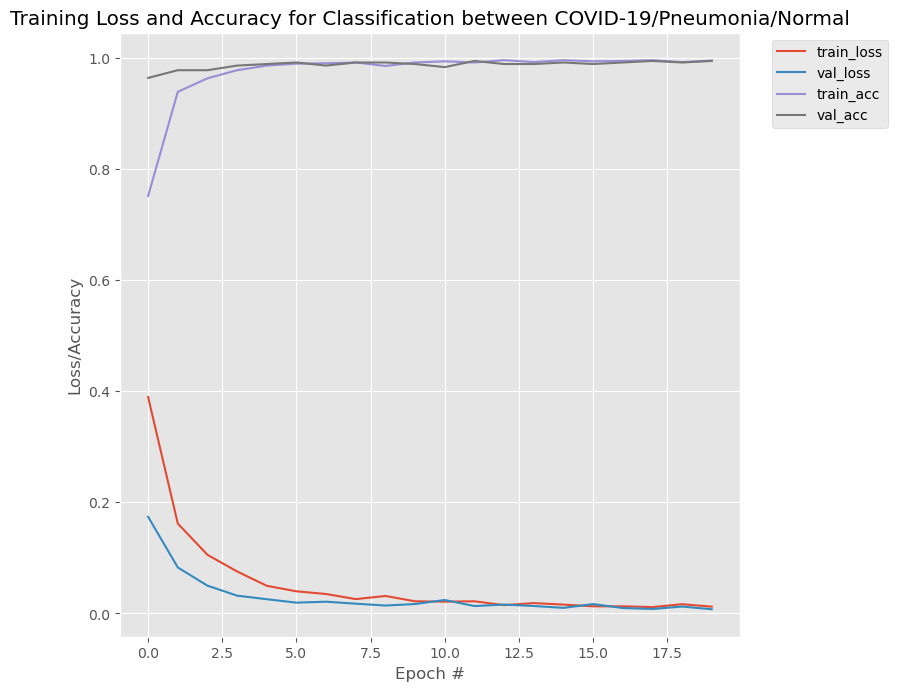

In [43]:
# plot the training loss and accuracy
N = EPOCHS
plt.style.use('ggplot')
plt.figure()
plt.plot(np.arange(0, N), training.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), training.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), training.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), training.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy for Classification between COVID-19/Pneumonia/Normal")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="upper right", bbox_to_anchor=(1.25, 1))
plt.savefig("plot.png")

## Evaluting the model

In [44]:
# make predictions on the testing set
print("[INFO] evaluating network...")
predIdxs = model.predict(X_test, batch_size=BS)
# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)
# show a nicely formatted classification report
print(classification_report(y_test.argmax(axis=1), predIdxs, target_names=lb_encoder.classes_))

[INFO] evaluating network...
              precision    recall  f1-score   support

       covid       1.00      0.98      0.99       120
      normal       0.99      1.00      1.00       120
   pneumonia       0.99      1.00      1.00       120

    accuracy                           0.99       360
   macro avg       0.99      0.99      0.99       360
weighted avg       0.99      0.99      0.99       360



In [45]:
# compute the confusion matrix and and use it to derive the raw
# accuracy, sensitivity, and specificity
cm = confusion_matrix(y_test.argmax(axis=1), predIdxs)
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
# show the accuracy, sensitivity, and specificity of the test
print("accuracy: {:.4f}".format(acc))
print("sensitivity: {:.4f}".format(sensitivity))
print("specificity: {:.4f}".format(specificity))


accuracy: 0.6611
sensitivity: 0.9916
specificity: 1.0000


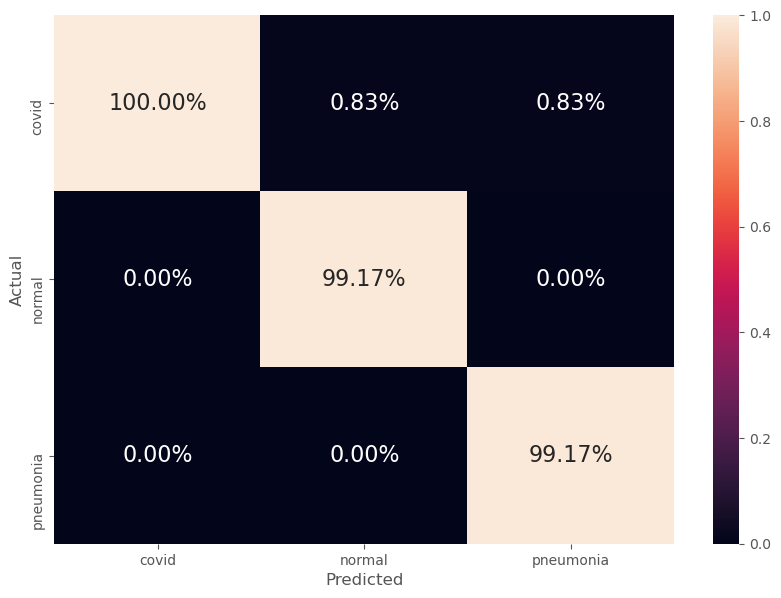

In [46]:
df_cm= pd.DataFrame(cm, columns=lb_encoder.classes_, index=lb_encoder.classes_)
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.heatmap(df_cm/np.sum(df_cm), fmt='.2%', annot = True, annot_kws={'size':16})
plt.show()

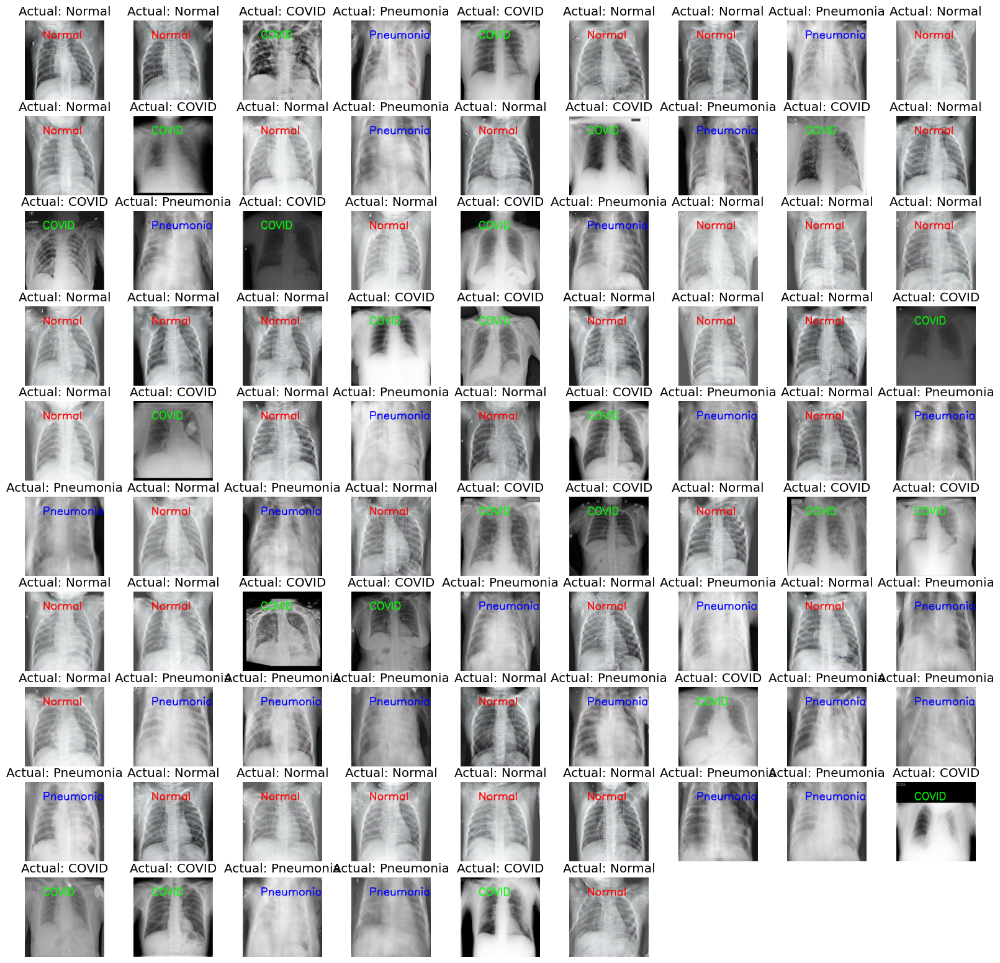

In [47]:
rows = 10
columns = 9
fig = plt.figure(figsize=(20, 20))
for m in range(1, 88):
    if str(lb_encoder.inverse_transform(predIdxs)[m-1]) == "covid":
        text = "COVID"
        color = (0, 255, 0)
    elif str(lb_encoder.inverse_transform(predIdxs)[m-1]) == "normal":
        text = "Normal"
        color = (255, 0, 0)
    elif str(lb_encoder.inverse_transform(predIdxs)[m-1]) == "pneumonia":
        text = "Pneumonia"
        color = (0, 0, 255)
        
    if str(lb_encoder.inverse_transform(y_test.argmax(axis=1))[m-1]) == "covid":
        text2 = "COVID"
        color2 = (0, 255, 0)
    elif str(lb_encoder.inverse_transform(y_test.argmax(axis=1))[m-1]) == "normal":
        text2 = "Normal"
        color2 = (255, 0, 0)
    elif str(lb_encoder.inverse_transform(y_test.argmax(axis=1))[m-1]) == "pneumonia":
        text2 = "Pneumonia"
        color2 = (0, 0, 255)
    img = X_test[m-1].copy()
    # Window name in which image is displayed 
    window_name = text
  
    # font 
    font = cv2.FONT_HERSHEY_SIMPLEX 
  
    # org 
    org = (50, 50) 
  
    # fontScale 
    fontScale = 1
  
    # Line thickness of 2 px 
    thickness = 2
    img = cv2.putText(img, text, org, font,
                      fontScale, color, thickness, cv2.LINE_AA)
    fig.add_subplot(rows, columns, m)
    plt.imshow(img)
    plt.title("Actual: " + text2)
    plt.axis('off')
plt.show()

In [48]:
new_dataset ='../input/covid19-radiography-database/COVID-19 Radiography Database'

In [49]:
new_data = []
for imagePath in imagePaths:
    new_image = cv2.imread(imagePath)
    new_image = cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB)
    new_image = cv2.resize(new_image, (224, 224))
    # update the data and labels lists, respectively
    new_data.append(new_image)

new_data = np.array(new_data) / 255.0
new_data.shape

(1800, 224, 224, 3)

In [ ]:
# make new predictions:
print("[INFO] Making new predictions...")
new_pred = model.predict(new_data, batch_size=BS)
# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
new_pred = np.argmax(new_pred, axis=1)


In [ ]:
print("[INFO] printing new images with their classification")
rows = 1
columns = 3
fig = plt.figure(figsize=(20, 20))
for m in range(1, 4):
    if str(lb_encoder.inverse_transform(new_pred)[m-1]) == "covid":
        text = "COVID"
        color = (0, 255, 0)
    elif str(lb_encoder.inverse_transform(new_pred)[m-1]) == "normal":
        text = "Normal"
        color = (255, 0, 0)
    elif str(lb_encoder.inverse_transform(new_pred)[m-1]) == "pneumonia":
        text = "Pneumonia"
        color = (0, 0, 255)
    img = X_test[m-1].copy()
    # Window name in which image is displayed 
    window_name = text
  
    # font 
    font = cv2.FONT_HERSHEY_SIMPLEX 
  
    # org 
    org = (50, 50) 
  
    # fontScale 
    fontScale = 1
  
    # Line thickness of 2 px 
    thickness = 2
    img = cv2.putText(img, text, org, font,
                      fontScale, color, thickness, cv2.LINE_AA)
    fig.add_subplot(rows, columns, m)
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [ ]:
new_data2 = []

# Making some new testing for a specific image in the file:
new_imag2 = cv2.imread('../input/covid19-radiography-database/COVID-19_Radiography_Dataset/COVID/images/COVID-10.png')
new_imag2 = cv2.cvtColor(new_imag2, cv2.COLOR_BGR2RGB)
new_imag2 = cv2.resize(new_imag2, (224,224))
new_data2.append(new_imag2)

new_data2 = np.array(new_data2)/255.0

# make new prediction
print("[INFO] Making new prediction...")
new_pred2 = model.predict(new_data2, batch_size=BS)
# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
new_pred2 = np.argmax(new_pred2, axis=1)

print("[INFO] printing new image with its classification")
rows = 1
columns = 3
fig = plt.figure(figsize=(20, 20))
for m in range(1, 2):
    if str(lb_encoder.inverse_transform(new_pred2)[m-1]) == "covid":
        text = "COVID"
        color = (0, 255, 0)
    elif str(lb_encoder.inverse_transform(new_pred2)[m-1]) == "normal":
        text = "Normal"
        color = (255, 0, 0)
    elif str(lb_encoder.inverse_transform(new_pred2)[m-1]) == "pneumonia":
        text = "Pneumonia"
        color = (0, 0, 255)
    img = X_test[m-1].copy()
    # Window name in which image is displayed 
    window_name = text
  
    # font 
    font = cv2.FONT_HERSHEY_SIMPLEX 
  
    # org 
    org = (50, 50) 
  
    # fontScale 
    fontScale = 1
  
    # Line thickness of 2 px 
    thickness = 2
    img = cv2.putText(img, text, org, font,
                      fontScale, color, thickness, cv2.LINE_AA)
    fig.add_subplot(rows, columns, m)
    plt.imshow(img)
    plt.axis('off')
plt.show()